<b><h1><center>DenseNet201</center></h1></b>

In [1]:
import cv2
import os
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import math
import random

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import *
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import *
from tensorflow.keras.callbacks import *

In [2]:
INIT_LR = 5e-4
EPOCHS = 40
BS = 32
tta_times = 10
imgSize = 768

# SHOW ORIGINAL IMAGES

In [3]:
def show_original_img(category):
    
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(24, 10))
    
    train_path = '../input/covid19-radiography-database/COVID-19 Radiography Database/'
    ten_random_samples = pd.Series(os.listdir(os.path.join(train_path, category))).sample(10).values
    
    for idx, image in enumerate(ten_random_samples):
        final_path = os.path.join(train_path, category, image)
        img = cv2.imread(final_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes.ravel()[idx].imshow(img)
        axes.ravel()[idx].axis('off')
    plt.tight_layout()

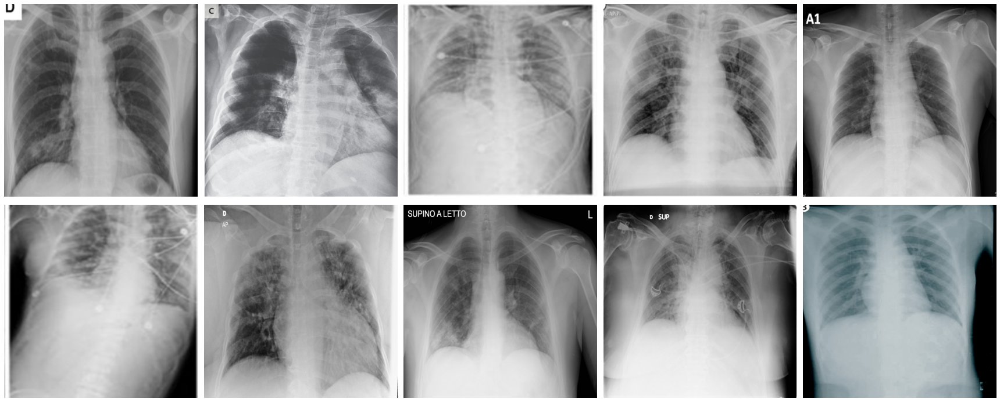

In [4]:
show_original_img('COVID-19')

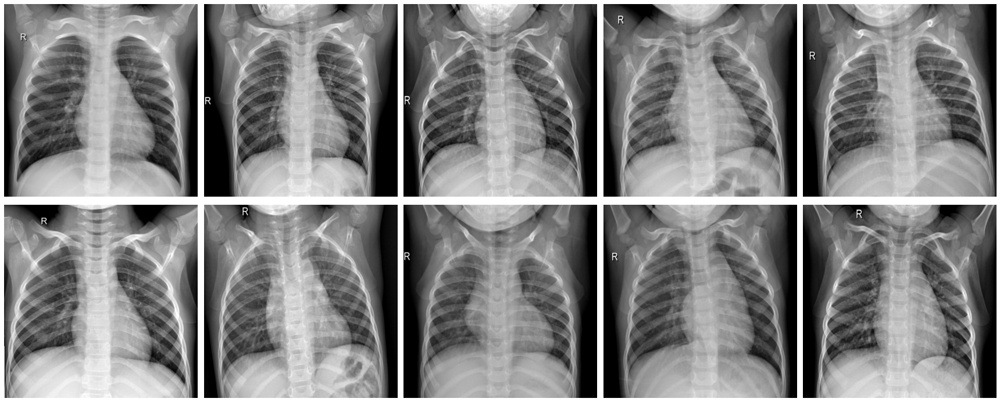

In [5]:
show_original_img('NORMAL')

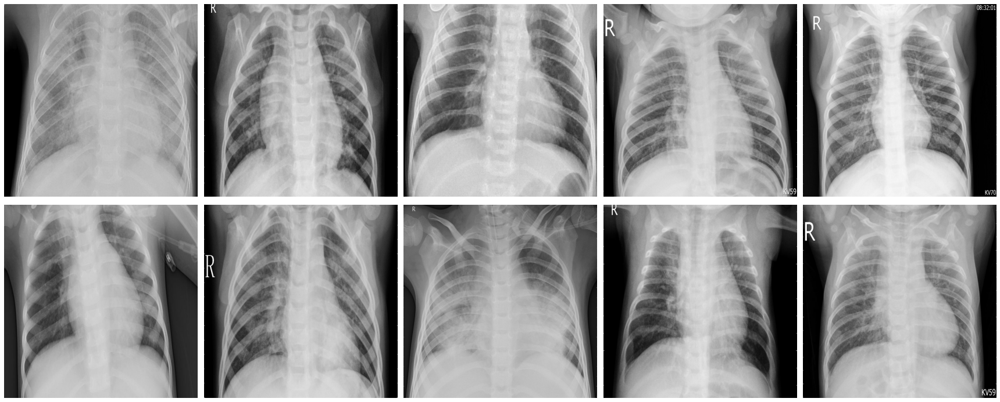

In [6]:
show_original_img('Viral Pneumonia')

We can see that images in the "NORMAL" and "Viral pneumonia" folders always have the letter 'R', raise up both hands and include the lower jawbone.

# IMAGE PREPROCESSING

In [7]:
imagePaths = []
for dirname, _, filenames in os.walk('/kaggle/input/covid19-radiography-database/COVID-19 Radiography Database/'):
    for filename in filenames:
        if (filename[-3:] == 'png'):
            imagePaths.append(os.path.join(dirname, filename))

In [8]:
os.makedirs('dataset/COVID-19')
os.makedirs('dataset/NORMAL')
os.makedirs('dataset/Viral Pneumonia')

In [9]:
for imagePath in tqdm(imagePaths):
    image = cv2.imread(imagePath)
    image = image[(1024-imgSize)//2:1024-(1024-imgSize)//2, (1024-imgSize)//2:1024-(1024-imgSize)//2]
    cv2.imwrite('dataset/'+'/'.join(imagePath.split(os.path.sep)[-2:]), image)

100%|██████████| 2905/2905 [02:12<00:00, 22.00it/s]


# SHOW CROPPED IMAGES

In [10]:
def show_cropped_img(category):
    
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(24, 10))
    
    train_path = 'dataset/'
    ten_random_samples = pd.Series(os.listdir(os.path.join(train_path, category))).sample(10).values
    
    for idx, image in enumerate(ten_random_samples):
        final_path = os.path.join(train_path, category, image)
        img = cv2.imread(final_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes.ravel()[idx].imshow(img)
        axes.ravel()[idx].axis('off')
    plt.tight_layout()

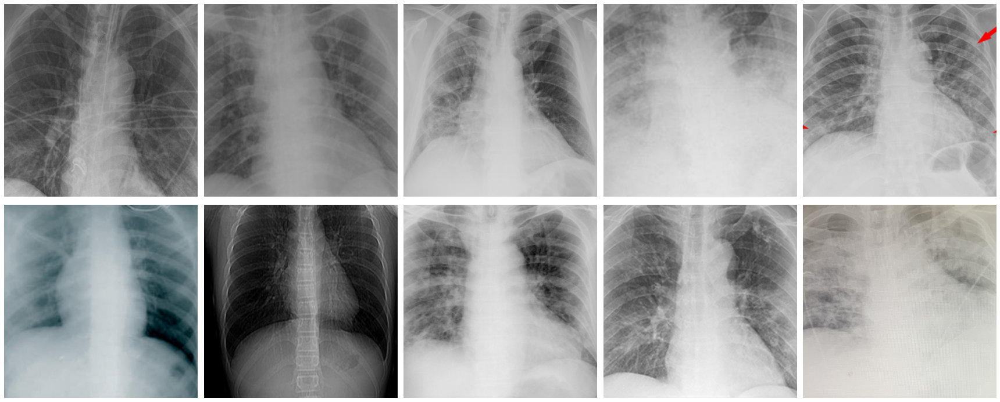

In [11]:
show_cropped_img('COVID-19')

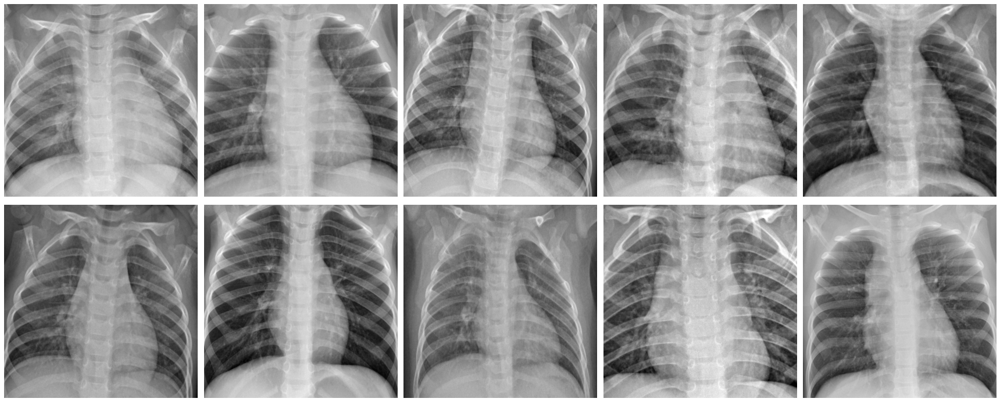

In [12]:
show_cropped_img('NORMAL')

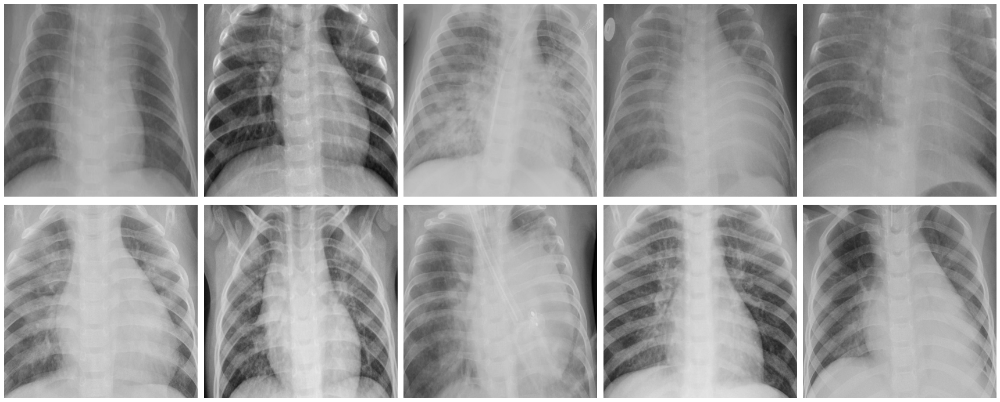

In [13]:
show_cropped_img('Viral Pneumonia')

# LOAD

In [14]:
def change_brightness(img):
    value = random.randint(-10,10)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    
    v = cv2.add(v,value)
    v[v > 255] = 255
    v[v < 0] = 0
    
    final_hsv = cv2.merge((h, s, v))
    img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
    return img

def preprocessing(img):
    img = change_brightness(img)
    return img

In [15]:
trainAug = ImageDataGenerator(rotation_range=20, 
                              horizontal_flip = True,
                              shear_range=0.1,
                              zoom_range=0.1,
                              channel_shift_range = 0.05,
                              fill_mode="nearest", 
                              rescale=1./255,
                              preprocessing_function = preprocessing,
                              validation_split=0.2)

In [16]:
train_generator = trainAug.flow_from_directory('dataset/',
                                               target_size=(imgSize, imgSize),
                                               batch_size=BS,
                                               class_mode='categorical', 
                                               subset='training')

Found 2325 images belonging to 3 classes.


In [17]:
test_generator = trainAug.flow_from_directory('dataset/',
                                              target_size=(imgSize, imgSize),
                                              batch_size=BS,
                                              class_mode='categorical', 
                                              subset='validation')

Found 580 images belonging to 3 classes.


# MODEL

In [18]:
baseModel = DenseNet201(weights="imagenet", include_top=False, input_tensor=Input(shape=(imgSize, imgSize, 3)))
headModel = baseModel.output
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(128, activation="relu")(headModel)
headModel = Dense(3, activation="softmax")(headModel)
model = Model(inputs=baseModel.input, outputs=headModel)
for layer in baseModel.layers:
    layer.trainable = False

74842112/74836368 [==============================] - 1s 0us/step


In [19]:
best_val_acc = 0
best_train_acc = 0
def saveModel(epoch,logs):
    val_acc = logs['val_accuracy']
    train_acc = logs['accuracy']
    global best_val_acc
    global best_train_acc

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        model.save('model.h5')
    elif val_acc == best_val_acc:
        if train_acc > best_train_acc:
            best_train_acc= train_acc
            model.save('model.h5')

In [20]:
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])
H = model.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // BS,
    validation_data=test_generator,
    validation_steps=test_generator.samples // BS,
    callbacks= [LambdaCallback(on_epoch_end=saveModel),
#              EarlyStopping(monitor='val_accuracy', patience=3),
#              ReduceLROnPlateau(monitor='val_accuracy', factor=0.5,patience=2),
              ],
    epochs=EPOCHS)

Epoch 1/40
72/72 [==============================] - 523s 7s/step - loss: 11.7963 - accuracy: 0.8120 - val_loss: 0.9130 - val_accuracy: 0.8889
Epoch 2/40
72/72 [==============================] - 504s 7s/step - loss: 0.5966 - accuracy: 0.9333 - val_loss: 0.4318 - val_accuracy: 0.9253
Epoch 3/40
72/72 [==============================] - 497s 7s/step - loss: 0.4883 - accuracy: 0.9311 - val_loss: 0.4109 - val_accuracy: 0.9531
Epoch 4/40
72/72 [==============================] - 494s 7s/step - loss: 0.2652 - accuracy: 0.9608 - val_loss: 0.4866 - val_accuracy: 0.9306
Epoch 5/40
72/72 [==============================] - 488s 7s/step - loss: 0.5187 - accuracy: 0.9376 - val_loss: 0.4906 - val_accuracy: 0.9375
Epoch 6/40
72/72 [==============================] - 490s 7s/step - loss: 0.2149 - accuracy: 0.9686 - val_loss: 0.3022 - val_accuracy: 0.9497
Epoch 7/40
72/72 [==============================] - 489s 7s/step - loss: 0.1490 - accuracy: 0.9699 - val_loss: 0.4121 - val_accuracy: 0.9514
Epoch 8/40
7

# PLOT

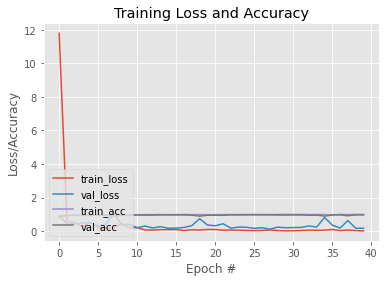

In [21]:
N = EPOCHS
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")

# TEST WITH TTA

In [22]:
def wrong_to_list(preds, generator):
    res = []
    for i in range(len(preds)):
        if (preds[i] != generator.labels[i]):
            res.append(generator.filenames[i])
    return res

def show_wrong_img(l):
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(24, 10))
    ten_random_samples = pd.Series(l).sample(min(len(l),10)).values
    
    for idx, image in enumerate(ten_random_samples):
        final_path = os.path.join('dataset/', image)
        img = cv2.imread(final_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes.ravel()[idx].imshow(img)
        axes.ravel()[idx].axis('off')
    plt.tight_layout()

## ON TRAIN

In [23]:
train = ImageDataGenerator(rescale=1./255,
                           validation_split=0.2).flow_from_directory('dataset/',
                                                                     target_size=(imgSize, imgSize),
                                                                     batch_size=BS,
                                                                     class_mode='categorical',
                                                                     shuffle = False,
                                                                     subset='training')

Found 2325 images belonging to 3 classes.


In [24]:
CName = {v: k for k, v in train.class_indices.items()}
predIdxs = model.predict_generator(train)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(train.labels, predIdxs, target_names=list(train.class_indices.keys()), digits = 5))

                 precision    recall  f1-score   support

       COVID-19    1.00000   1.00000   1.00000       176
         NORMAL    0.99168   1.00000   0.99582      1073
Viral Pneumonia    1.00000   0.99164   0.99580      1076

       accuracy                        0.99613      2325
      macro avg    0.99723   0.99721   0.99721      2325
   weighted avg    0.99616   0.99613   0.99613      2325



In [25]:
for i in range(len(predIdxs)):
    if (predIdxs[i] != train.labels[i]):
        print('Filename:',train.filenames[i].split('/')[1], '\t'*(5-math.ceil((len(train.filenames[i].split('/')[1])+3)/8)) +'PRED:', CName[predIdxs[i]])

Filename: Viral Pneumonia (1300).png 	PRED: NORMAL
Filename: Viral Pneumonia (321).png 	PRED: NORMAL
Filename: Viral Pneumonia (579).png 	PRED: NORMAL
Filename: Viral Pneumonia (606).png 	PRED: NORMAL
Filename: Viral Pneumonia (607).png 	PRED: NORMAL
Filename: Viral Pneumonia (620).png 	PRED: NORMAL
Filename: Viral Pneumonia (621).png 	PRED: NORMAL
Filename: Viral Pneumonia (687).png 	PRED: NORMAL
Filename: Viral Pneumonia (702).png 	PRED: NORMAL


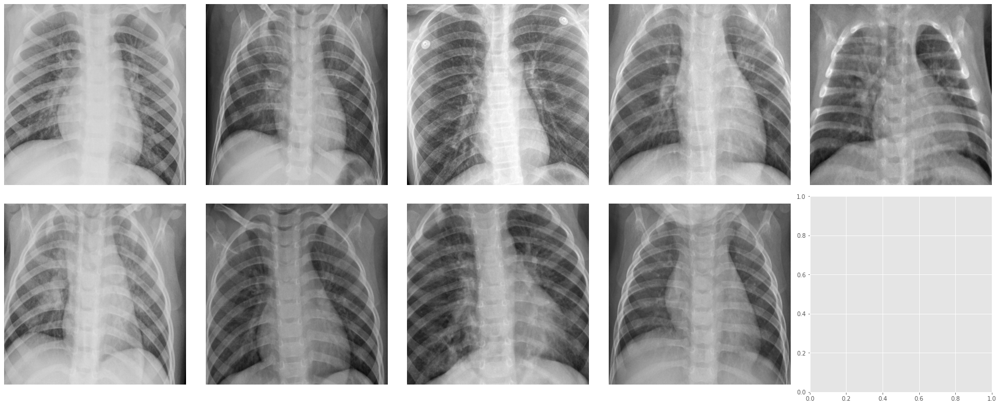

In [26]:
show_wrong_img(wrong_to_list(predIdxs, train))

## ON TEST

In [27]:
test = ImageDataGenerator(rescale=1./255, 
                          validation_split=0.2).flow_from_directory('dataset/',
                                                                    target_size=(imgSize, imgSize),
                                                                    batch_size=BS,
                                                                    class_mode='categorical', 
                                                                    shuffle = False, 
                                                                    subset='validation')

Found 580 images belonging to 3 classes.


In [28]:
CName = {v: k for k, v in test.class_indices.items()}
predIdxs = model.predict_generator(test, verbose=1)
predIdxs = np.argmax(predIdxs, axis=1)
print(classification_report(test.labels, predIdxs, target_names=list(test.class_indices.keys()), digits = 5))

19/19 [==============================] - 23s 1s/step
                 precision    recall  f1-score   support

       COVID-19    1.00000   0.95349   0.97619        43
         NORMAL    0.91753   0.99627   0.95528       268
Viral Pneumonia    0.98790   0.91078   0.94778       269

       accuracy                        0.95345       580
      macro avg    0.96848   0.95351   0.95975       580
   weighted avg    0.95628   0.95345   0.95335       580



In [29]:
for i in range(len(predIdxs)):
    if (predIdxs[i] != test.labels[i]):
        print('Filename:',test.filenames[i].split('/')[1], '\t'*(5-math.ceil((len(test.filenames[i].split('/')[1])+3)/8)) +'PRED:', CName[predIdxs[i]])

Filename: COVID-19 (129).png 		PRED: Viral Pneumonia
Filename: COVID-19 (132).png 		PRED: Viral Pneumonia
Filename: NORMAL (1230).png 		PRED: Viral Pneumonia
Filename: Viral Pneumonia (1000).png 	PRED: NORMAL
Filename: Viral Pneumonia (1003).png 	PRED: NORMAL
Filename: Viral Pneumonia (1012).png 	PRED: NORMAL
Filename: Viral Pneumonia (1013).png 	PRED: NORMAL
Filename: Viral Pneumonia (1023).png 	PRED: NORMAL
Filename: Viral Pneumonia (1039).png 	PRED: NORMAL
Filename: Viral Pneumonia (1044).png 	PRED: NORMAL
Filename: Viral Pneumonia (1067).png 	PRED: NORMAL
Filename: Viral Pneumonia (1072).png 	PRED: NORMAL
Filename: Viral Pneumonia (1081).png 	PRED: NORMAL
Filename: Viral Pneumonia (1085).png 	PRED: NORMAL
Filename: Viral Pneumonia (1107).png 	PRED: NORMAL
Filename: Viral Pneumonia (1114).png 	PRED: NORMAL
Filename: Viral Pneumonia (1124).png 	PRED: NORMAL
Filename: Viral Pneumonia (1132).png 	PRED: NORMAL
Filename: Viral Pneumonia (1141).png 	PRED: NORMAL
Filename: Viral Pneumonia 

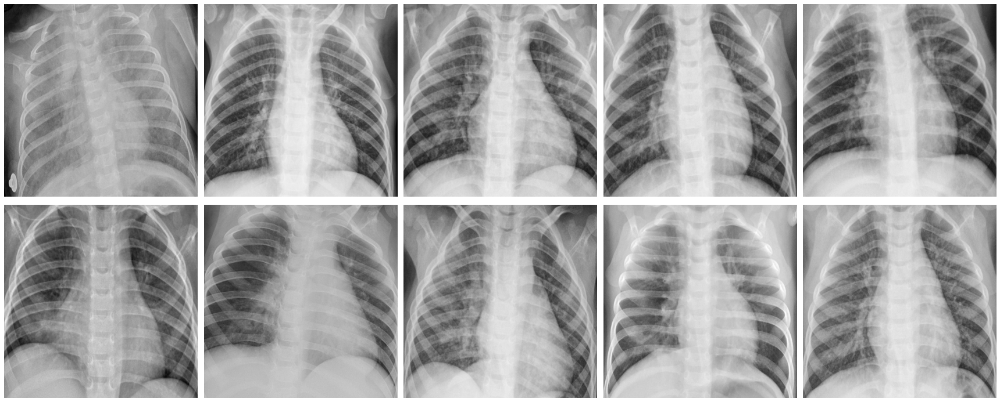

In [30]:
show_wrong_img(wrong_to_list(predIdxs, test))

# TEST WITH TTA

## ON TRAIN

In [31]:
train = ImageDataGenerator(rotation_range=5, 
                          horizontal_flip = True,
                          shear_range=0.05,
                          zoom_range=0.05,
                          channel_shift_range = 0.025,
                          fill_mode="nearest", 
                          rescale=1./255,
                          preprocessing_function = preprocessing,
                          validation_split=0.2).flow_from_directory('dataset/',
                                                                     target_size=(imgSize, imgSize),
                                                                     batch_size=BS,
                                                                     class_mode='categorical',
                                                                     shuffle = False,
                                                                     subset='training')
CName = {v: k for k, v in train.class_indices.items()}
probabilities = []
for i in range(tta_times+1):
    print('TTA Number: ', i, '\n')
    probabilities.append(model.predict(train, verbose=1))
predIdxs = np.mean(probabilities, axis=0)
predIdxs = np.argmax(predIdxs, axis=1)

Found 2325 images belonging to 3 classes.
TTA Number:  0 

73/73 [==============================] - 392s 5s/step
TTA Number:  1 

73/73 [==============================] - 386s 5s/step
TTA Number:  2 

73/73 [==============================] - 386s 5s/step
TTA Number:  3 

73/73 [==============================] - 387s 5s/step
TTA Number:  4 

73/73 [==============================] - 415s 6s/step
TTA Number:  5 

73/73 [==============================] - 451s 6s/step
TTA Number:  6 

73/73 [==============================] - 413s 6s/step
TTA Number:  7 

73/73 [==============================] - 383s 5s/step
TTA Number:  8 

73/73 [==============================] - 379s 5s/step
TTA Number:  9 

73/73 [==============================] - 379s 5s/step
TTA Number:  10 

73/73 [==============================] - 375s 5s/step


In [32]:
print(classification_report(train.labels, predIdxs, target_names=list(train.class_indices.keys()), digits = 5))

                 precision    recall  f1-score   support

       COVID-19    1.00000   1.00000   1.00000       176
         NORMAL    1.00000   1.00000   1.00000      1073
Viral Pneumonia    1.00000   1.00000   1.00000      1076

       accuracy                        1.00000      2325
      macro avg    1.00000   1.00000   1.00000      2325
   weighted avg    1.00000   1.00000   1.00000      2325



In [33]:
for i in range(len(predIdxs)):
    if (predIdxs[i] != train.labels[i]):
        print('Filename:',train.filenames[i].split('/')[1], '\t'*(5-math.ceil((len(train.filenames[i].split('/')[1])+3)/8)) +'PRED:', CName[predIdxs[i]])

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:10: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  # Remove the CWD from sys.path while we load stuff.


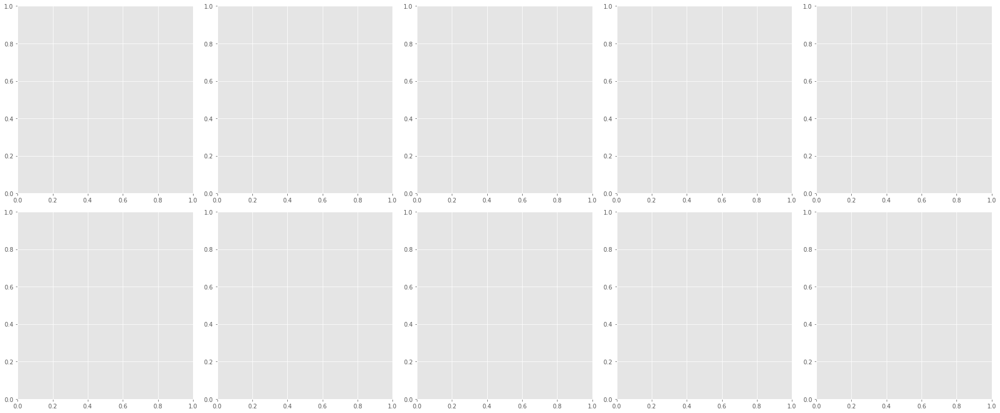

In [34]:
show_wrong_img(wrong_to_list(predIdxs, train))

## ON TEST

In [35]:
test = ImageDataGenerator(rotation_range=5, 
                          horizontal_flip = True,
                          shear_range=0.05,
                          zoom_range=0.05,
                          channel_shift_range = 0.025,
                          fill_mode="nearest", 
                          rescale=1./255,
                          preprocessing_function = preprocessing,
                          validation_split=0.2).flow_from_directory('dataset/',
                                                                    target_size=(imgSize, imgSize),
                                                                    batch_size=BS,
                                                                    class_mode='categorical', 
                                                                    shuffle = False, 
                                                                    subset='validation')
CName = {v: k for k, v in test.class_indices.items()}
probabilities = []
for i in range(tta_times+1):
    print('TTA Number: ', i, '\n')
    probabilities.append(model.predict(test, verbose=1))
predIdxs = np.mean(probabilities, axis=0)
predIdxs = np.argmax(predIdxs, axis=1)

Found 580 images belonging to 3 classes.
TTA Number:  0 

19/19 [==============================] - 90s 5s/step
TTA Number:  1 

19/19 [==============================] - 89s 5s/step
TTA Number:  2 

19/19 [==============================] - 90s 5s/step
TTA Number:  3 

19/19 [==============================] - 90s 5s/step
TTA Number:  4 

19/19 [==============================] - 88s 5s/step
TTA Number:  5 

19/19 [==============================] - 89s 5s/step
TTA Number:  6 

19/19 [==============================] - 89s 5s/step
TTA Number:  7 

19/19 [==============================] - 88s 5s/step
TTA Number:  8 

19/19 [==============================] - 89s 5s/step
TTA Number:  9 

19/19 [==============================] - 89s 5s/step
TTA Number:  10 

19/19 [==============================] - 88s 5s/step


In [36]:
print(classification_report(test.labels, predIdxs, target_names=list(test.class_indices.keys()), digits = 5))

                 precision    recall  f1-score   support

       COVID-19    1.00000   0.93023   0.96386        43
         NORMAL    0.95985   0.98134   0.97048       268
Viral Pneumonia    0.96992   0.95911   0.96449       269

       accuracy                        0.96724       580
      macro avg    0.97659   0.95689   0.96627       580
   weighted avg    0.96750   0.96724   0.96721       580



In [37]:
for i in range(len(predIdxs)):
    if (predIdxs[i] != test.labels[i]):
        print('Filename:',test.filenames[i].split('/')[1], '\t'*(5-math.ceil((len(test.filenames[i].split('/')[1])+3)/8)) +'PRED:', CName[predIdxs[i]], '\t'*(4-(3+len(CName[predIdxs[i]]))//8) + 'TRUE:', CName[test.labels[i]])

Filename: COVID-19 (122).png 		PRED: Viral Pneumonia 		TRUE: COVID-19
Filename: COVID-19 (129).png 		PRED: Viral Pneumonia 		TRUE: COVID-19
Filename: COVID-19 (132).png 		PRED: Viral Pneumonia 		TRUE: COVID-19
Filename: NORMAL (1075).png 		PRED: Viral Pneumonia 		TRUE: NORMAL
Filename: NORMAL (1093).png 		PRED: Viral Pneumonia 		TRUE: NORMAL
Filename: NORMAL (1149).png 		PRED: Viral Pneumonia 		TRUE: NORMAL
Filename: NORMAL (1206).png 		PRED: Viral Pneumonia 		TRUE: NORMAL
Filename: NORMAL (1230).png 		PRED: Viral Pneumonia 		TRUE: NORMAL
Filename: Viral Pneumonia (1003).png 	PRED: NORMAL 			TRUE: Viral Pneumonia
Filename: Viral Pneumonia (1023).png 	PRED: NORMAL 			TRUE: Viral Pneumonia
Filename: Viral Pneumonia (1044).png 	PRED: NORMAL 			TRUE: Viral Pneumonia
Filename: Viral Pneumonia (1072).png 	PRED: NORMAL 			TRUE: Viral Pneumonia
Filename: Viral Pneumonia (1107).png 	PRED: NORMAL 			TRUE: Viral Pneumonia
Filename: Viral Pneumonia (1141).png 	PRED: NORMAL 			TRUE: Viral Pneumonia

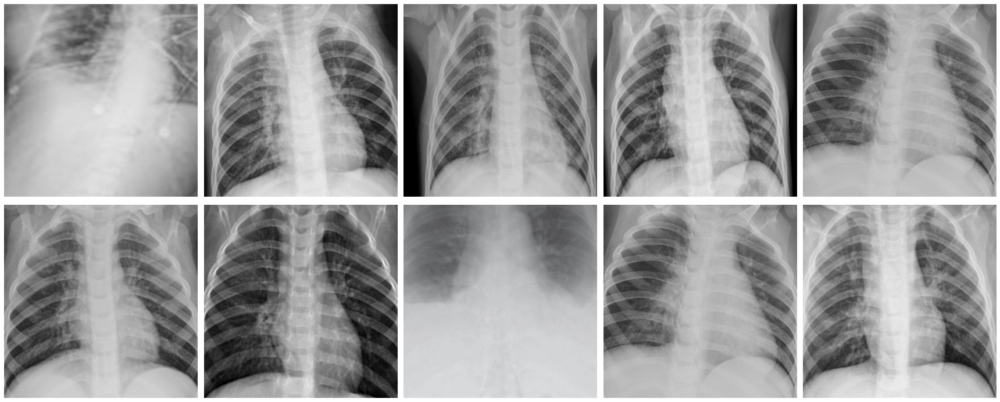

In [38]:
show_wrong_img(wrong_to_list(predIdxs, test))